In [1]:

import os
from collections import defaultdict

output_directory = "D:/WORK/Baybayin App Project/dataset - Copy"
# Initialize a dictionary to store the count of images per class
class_counts = defaultdict(int)

# Iterate through each class directory in the output directory
for class_name in os.listdir(output_directory):
  class_path = os.path.join(output_directory, class_name)
  if os.path.isdir(class_path):
    # Count the number of images in the class directory
    class_counts[class_name] += len([img for img in os.listdir(class_path) if img.endswith('.jpg')])

# Print the counts
for class_name, count in class_counts.items():
  print(f"{class_name}: {count} images")

# Find and print the class with the least number of images
least_class = min(class_counts, key=class_counts.get)
print(f"Class with the least number of images: {least_class} with {class_counts[least_class]} images")

a: 2754 images
b: 371 images
ba: 3446 images
be_bi: 1332 images
bo_bu: 1324 images
d: 535 images
da: 3864 images
de_di: 1477 images
do_du: 1480 images
e_i: 2711 images
g: 334 images
ga: 3792 images
ge_gi: 1319 images
go_gu: 1334 images
h: 361 images
ha: 3695 images
he_hi: 1323 images
ho_hu: 1316 images
k: 284 images
ka: 3843 images
ke_ki: 1292 images
ko_ku: 1268 images
l: 1350 images
la: 3583 images
le_li: 1300 images
lo_lu: 1302 images
m: 1383 images
ma: 3508 images
me_mi: 1322 images
mo_mu: 1332 images
n: 1323 images
na: 3662 images
ne_ni: 1298 images
ng: 1361 images
nga: 3688 images
nge_ngi: 1332 images
ngo_ngu: 1315 images
no_nu: 1287 images
o_u: 2638 images
p: 1379 images
pa: 3551 images
pe_pi: 1356 images
po_pu: 1364 images
s: 1352 images
sa: 3449 images
se_si: 1318 images
so_su: 1321 images
t: 1354 images
ta: 3609 images
te_ti: 1337 images
to_tu: 1318 images
w: 1373 images
wa: 3663 images
we_wi: 1347 images
wo_wu: 1360 images
y: 1383 images
ya: 3559 images
ye_yi: 1327 images
yo_

In [5]:
import os
from PIL import Image
from tqdm import tqdm
from uuid import uuid4

# Directory containing subfolders with images
base_dir = "D:/WORK/Baybayin App Project/dataset - Copy - Copy"

# List of valid image extensions
valid_extensions = {".png", ".jpeg", ".jpg", ".bmp", ".gif", ".tiff"}

def convert_to_jpg(base_dir):
    for root, dirs, files in os.walk(base_dir):
        for file in tqdm(files, desc=f"Processing images in {root}"):
            file_path = os.path.join(root, file)
            file_extension = os.path.splitext(file)[1].lower()

            # Skip non-image files
            if file_extension not in valid_extensions:
                continue

            try:
                # Open image and convert to RGB
                with Image.open(file_path) as img:
                    rgb_img = img.convert("RGB")

                    # Create a unique file path for the new JPG file
                    base_name = os.path.splitext(file)[0]
                    new_file_path = os.path.join(root, base_name + f"_{uuid4().hex[:8]}.jpg")

                    # Save the converted image
                    rgb_img.save(new_file_path, "JPEG")

                    # Remove the original file if it was not a JPG
                    if file_extension != ".jpg":
                        os.remove(file_path)

            except Exception as e:
                # Log the error and continue with other files
                print(f"Error processing {file_path}: {e}")
                with open("error_log.txt", "a") as log_file:
                    log_file.write(f"{file_path}: {e}\n")

if __name__ == "__main__":
    convert_to_jpg(base_dir)


Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy: 0it [00:00, ?it/s]
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\a: 100%|██████████| 2754/2754 [00:26<00:00, 103.67it/s]
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\b: 100%|██████████| 1371/1371 [00:15<00:00, 87.45it/s] 
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\ba: 100%|██████████| 3446/3446 [00:37<00:00, 91.81it/s] 
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\be_bi: 100%|██████████| 1332/1332 [00:15<00:00, 87.67it/s] 
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\bo_bu: 100%|██████████| 1324/1324 [00:09<00:00, 143.45it/s]
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\d: 100%|██████████| 1535/1535 [00:15<00:00, 101.35it/s]
Processing images in D:/WORK/Baybayin App Project/dataset - Copy - Copy\da: 100%|██████████| 3864/3864 [00:36<00:00, 104.80it/s]
Pr

In [8]:
from imagededup.methods import PHash
import os

# Initialize perceptual hasher
phasher = PHash()

# Directory containing images
image_dir = 'D:/WORK/Baybayin App Project/dataset - Copy - Copy/a'

# Generate encodings (hashes) for all images
encodings = phasher.encode_images(image_dir=image_dir)

# Find duplicates
duplicates = phasher.find_duplicates(encoding_map=encodings, max_distance_threshold=10)

# Display duplicates
for key, values in duplicates.items():
    if values:
        print(f"\n{key} has duplicates: {values}")


2025-01-11 02:26:23,532: INFO Start: Calculating hashes...
100%|██████████| 5508/5508 [00:43<00:00, 125.99it/s]
2025-01-11 02:27:09,846: INFO End: Calculating hashes!
c:\Users\rojgi\AppData\Local\Programs\Python\Python310\lib\site-packages\imagededup\methods\hashing.py:317: RuntimeWarning: Parameter num_enc_workers has no effect since encodings are already provided
  warnings.warn('Parameter num_enc_workers has no effect since encodings are already provided', RuntimeWarning)
2025-01-11 02:27:09,848: INFO Start: Evaluating hamming distances for getting duplicates
2025-01-11 02:27:09,849: INFO Start: Retrieving duplicates using BKTree algorithm
100%|██████████| 5508/5508 [00:46<00:00, 118.08it/s]
2025-01-11 02:27:59,840: INFO End: Retrieving duplicates using BKTree algorithm
2025-01-11 02:27:59,842: INFO End: Evaluating hamming distances for getting duplicates



0_0001_jpg.rf.09b83bd1811e49b1cabf8582488cae54.jpg has duplicates: ['0_0001_jpg.rf.09b83bd1811e49b1cabf8582488cae54_70f3d338.jpg', 'a (517).jpg', 'a (932).jpg', 'a (932)_5bde6b0d.jpg', 'a (592)_7478ed0f.jpg', 'a (592).jpg', 'a (793).jpg', 'a (793)_7a42df87.jpg', 'a (517)_481644cb.jpg']

0_0001_jpg.rf.09b83bd1811e49b1cabf8582488cae54_70f3d338.jpg has duplicates: ['0_0001_jpg.rf.09b83bd1811e49b1cabf8582488cae54.jpg', 'a (517).jpg', 'a (932).jpg', 'a (932)_5bde6b0d.jpg', 'a (592)_7478ed0f.jpg', 'a (592).jpg', 'a (793).jpg', 'a (793)_7a42df87.jpg', 'a (517)_481644cb.jpg']

0_0001_jpg.rf.0fdc686756aebb80c277437069c0b07d.jpg has duplicates: ['0_0001_jpg.rf.0fdc686756aebb80c277437069c0b07d_d3a75786.jpg', '0_0001_jpg.rf.c3f1764e029ebcc9cae34e69d860bb7a.jpg', '0_0001_jpg.rf.c3f1764e029ebcc9cae34e69d860bb7a_057eb193.jpg', 'IMG_20220427_160224_jpg.rf.4182b8de9eb598fee7481cd764661d3a.jpg', 'IMG_20220427_160224_jpg.rf.4182b8de9eb598fee7481cd764661d3a_c20353f0.jpg', 'a_00057_file029.jpg', 'a_00057_

In [4]:

import os
from collections import defaultdict

output_directory = "D:/WORK/Baybayin App Project/dataset - Copy"
# Initialize a dictionary to store the count of images per class
class_counts = defaultdict(int)

# Iterate through each class directory in the output directory
for class_name in os.listdir(output_directory):
  class_path = os.path.join(output_directory, class_name)
  if os.path.isdir(class_path):
    # Count the number of images in the class directory
    class_counts[class_name] += len([img for img in os.listdir(class_path) if img.endswith('.jpg')])

# Print the counts
for class_name, count in class_counts.items():
  print(f"{class_name}: {count} images")

# Find and print the class with the least number of images
least_class = min(class_counts, key=class_counts.get)
print(f"Class with the least number of images: {least_class} with {class_counts[least_class]} images")

a: 2754 images
b: 371 images
ba: 3446 images
be_bi: 1332 images
bo_bu: 1324 images
d: 535 images
da: 3864 images
de_di: 1477 images
do_du: 1480 images
e_i: 2711 images
g: 334 images
ga: 3792 images
ge_gi: 1319 images
go_gu: 1334 images
h: 361 images
ha: 3695 images
he_hi: 1323 images
ho_hu: 1316 images
k: 284 images
ka: 3843 images
ke_ki: 1292 images
ko_ku: 1268 images
l: 1350 images
la: 3583 images
le_li: 1300 images
lo_lu: 1302 images
m: 1383 images
ma: 3508 images
me_mi: 1322 images
mo_mu: 1332 images
n: 1323 images
na: 3662 images
ne_ni: 1298 images
ng: 1361 images
nga: 3688 images
nge_ngi: 1332 images
ngo_ngu: 1315 images
no_nu: 1287 images
o_u: 2638 images
p: 1379 images
pa: 3551 images
pe_pi: 1356 images
po_pu: 1364 images
s: 1352 images
sa: 3449 images
se_si: 1318 images
so_su: 1321 images
t: 1354 images
ta: 3609 images
te_ti: 1337 images
to_tu: 1318 images
w: 1373 images
wa: 3663 images
we_wi: 1347 images
wo_wu: 1360 images
y: 1383 images
ya: 3559 images
ye_yi: 1327 images
yo_

In [11]:
import os
from collections import defaultdict

output_directory = r"D:\WORK\Baybayin App Project\dataset - Copy - Copy"
# Initialize a dictionary to store the count of images per class
class_counts = defaultdict(int)

# Iterate through each class directory in the output directory
for class_name in os.listdir(output_directory):
  class_path = os.path.join(output_directory, class_name)
  if os.path.isdir(class_path):
    # Count the number of images in the class directory
    class_counts[class_name] += len([img for img in os.listdir(class_path) if img.endswith('.jpg')])

# Print the counts
for class_name, count in class_counts.items():
  print(f"{class_name}: {count} images")

# Find and print the class with the least number of images
least_class = min(class_counts, key=class_counts.get)
print(f"Class with the least number of images: {least_class} with {class_counts[least_class]} images")

a: 5508 images
b: 1742 images
ba: 6892 images
be_bi: 2664 images
bo_bu: 2648 images
d: 2070 images
da: 7728 images
de_di: 2954 images
do_du: 2960 images
e_i: 5422 images
g: 1668 images
ga: 7584 images
ge_gi: 2638 images
go_gu: 2668 images
h: 1722 images
ha: 7390 images
he_hi: 2646 images
ho_hu: 2632 images
k: 1568 images
ka: 7686 images
ke_ki: 2584 images
ko_ku: 2536 images
l: 2700 images
la: 7166 images
le_li: 2600 images
lo_lu: 2604 images
m: 2766 images
ma: 7016 images
me_mi: 2644 images
mo_mu: 2664 images
n: 2646 images
na: 7324 images
ne_ni: 2596 images
ng: 2722 images
nga: 7376 images
nge_ngi: 2664 images
ngo_ngu: 2630 images
no_nu: 2574 images
o_u: 5276 images
p: 2758 images
pa: 7102 images
pe_pi: 2712 images
po_pu: 2728 images
s: 2704 images
sa: 6898 images
se_si: 2636 images
so_su: 2642 images
t: 2708 images
ta: 7218 images
te_ti: 2674 images
to_tu: 2636 images
w: 2746 images
wa: 7326 images
we_wi: 2694 images
wo_wu: 2720 images
y: 2766 images
ya: 7118 images
ye_yi: 2654 image

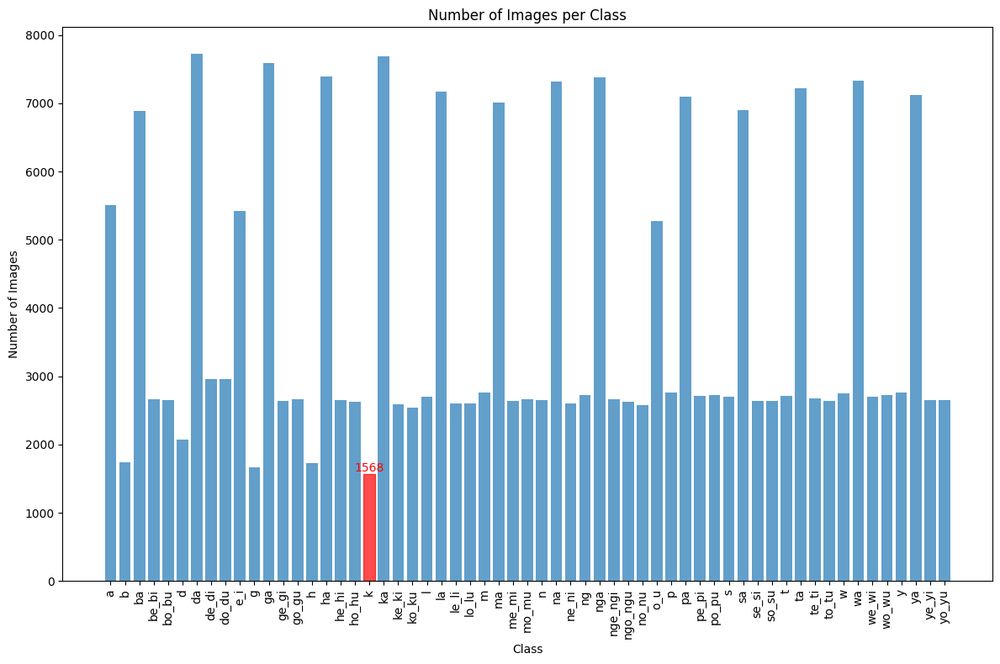

In [12]:
import matplotlib.pyplot as plt

# Visualization: Number of classes
plt.figure(figsize=(12, 8))
bars = plt.bar(class_counts.keys(), class_counts.values(), alpha=0.7)
plt.xticks(rotation=90)
plt.title("Number of Images per Class")
plt.xlabel("Class")
plt.ylabel("Number of Images")

# Highlight the class with the least number of images
for bar in bars:
  if bar.get_x() + bar.get_width() / 2 == list(class_counts.keys()).index(least_class):
    bar.set_color('r')
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), f'{bar.get_height()}', ha='center', va='bottom', color='red')

plt.tight_layout()
plt.show()


In [14]:
import os

# Define the dataset path
dataset_path = r"D:\WORK\Baybayin App Project\dataset - Copy - Copy"

# Count all images in the folder and its subfolders
total_images = 0
for root, dirs, files in os.walk(dataset_path):
  total_images += len([f for f in files if f.endswith(('.jpg', '.png'))])

print(f"Total number of images in the dataset: {total_images}")

Total number of images in the dataset: 225972


In [15]:
import os
import random
import shutil
from tqdm import tqdm

# Paths
source_dir = r"D:\WORK\Baybayin App Project\dataset - Copy - Copy"
destination_dir = r"D:\WORK\Baybayin App Project\sampled_dataset_v1"

# Number of images per class
num_images_per_class = 1000

def create_sampled_dataset(source_dir, destination_dir, num_images_per_class):
    # Ensure the destination directory exists
    if not os.path.exists(destination_dir):
        os.makedirs(destination_dir)

    # Iterate through each subfolder in the source directory
    for class_folder in tqdm(os.listdir(source_dir), desc="Processing classes"):
        class_path = os.path.join(source_dir, class_folder)
        
        # Ensure the current item is a directory
        if os.path.isdir(class_path):
            # Create corresponding folder in the destination directory
            dest_class_path = os.path.join(destination_dir, class_folder)
            os.makedirs(dest_class_path, exist_ok=True)

            # Get a list of all image files in the current class folder
            image_files = [f for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
            
            # Randomly select the required number of images
            selected_files = random.sample(image_files, min(num_images_per_class, len(image_files)))

            # Copy the selected images to the destination class folder
            for file in selected_files:
                src_file = os.path.join(class_path, file)
                dest_file = os.path.join(dest_class_path, file)
                shutil.copy(src_file, dest_file)

if __name__ == "__main__":
    create_sampled_dataset(source_dir, destination_dir, num_images_per_class)


Processing classes: 100%|██████████| 59/59 [19:13<00:00, 19.56s/it]


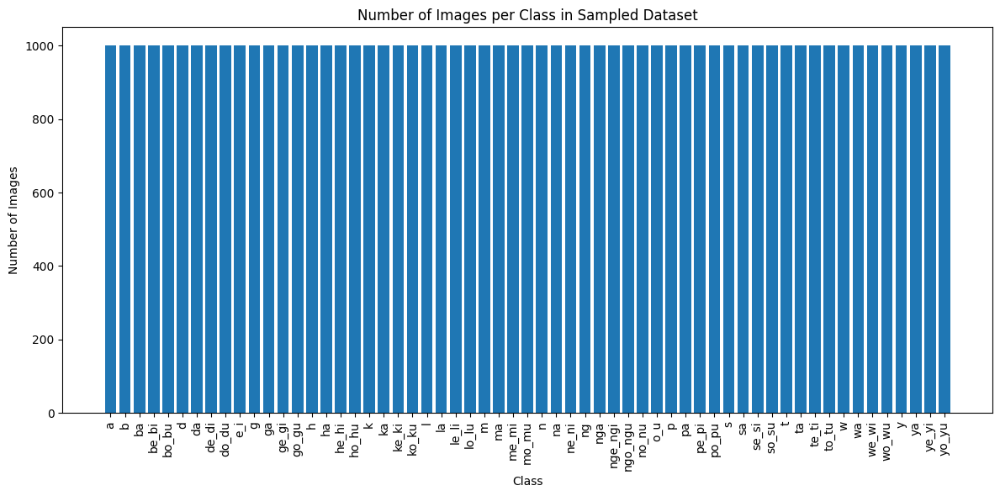

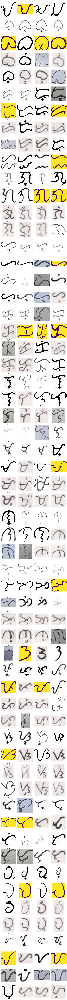

In [18]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

# Path to the sampled dataset
sampled_dir = r"D:\WORK\Baybayin App Project\sampled_dataset_v1"

def visualize_sampled_dataset(sampled_dir):
    # Collect information about the sampled dataset
    class_counts = {}
    sample_images = {}

    for class_folder in os.listdir(sampled_dir):
        class_path = os.path.join(sampled_dir, class_folder)
        if os.path.isdir(class_path):
            images = [os.path.join(class_path, f) for f in os.listdir(class_path) if os.path.isfile(os.path.join(class_path, f))]
            class_counts[class_folder] = len(images)
            # Randomly select 4 images for visualization
            sample_images[class_folder] = random.sample(images, min(4, len(images)))

    # Bar chart: Number of images per class
    plt.figure(figsize=(12, 6))
    plt.bar(class_counts.keys(), class_counts.values())
    plt.title("Number of Images per Class in Sampled Dataset")
    plt.xlabel("Class")
    plt.ylabel("Number of Images")
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

    # Grid visualization: Sample images from each class
    plt.figure(figsize=(12, len(sample_images) * 3))
    for idx, (class_name, images) in enumerate(sample_images.items()):
        for i, img_path in enumerate(images):
            plt.subplot(len(sample_images), 4, idx * 4 + i + 1)
            img = Image.open(img_path)
            plt.imshow(img)
            plt.axis("off")
            if i == 0:
                plt.title(class_name)
    plt.tight_layout()
    plt.show()

if __name__ == "__main__":
    visualize_sampled_dataset(sampled_dir)


In [16]:
import os
import random
import shutil

def split_dataset_fixed(dataset_directory, output_directory):
    """
    Split the dataset with exactly 264 images per class into train (700), val (200), and test (100).
    """
    # Explicit counts
    train_count = 700
    val_count = 200
    test_count = 100

    # Ensure output directories exist
    train_dir = os.path.join(output_directory, "train")
    val_dir = os.path.join(output_directory, "val")
    test_dir = os.path.join(output_directory, "test")

    for directory in [train_dir, val_dir, test_dir]:
        if not os.path.exists(directory):
            os.makedirs(directory)

    # Loop through each class folder
    for class_folder in os.listdir(dataset_directory):
        class_path = os.path.join(dataset_directory, class_folder)

        if os.path.isdir(class_path):
            # Create corresponding subdirectories in train, val, and test folders
            for split_dir in [train_dir, val_dir, test_dir]:
                split_class_path = os.path.join(split_dir, class_folder)
                if not os.path.exists(split_class_path):
                    os.makedirs(split_class_path)

            # List all images in the class folder
            images = os.listdir(class_path)
            if len(images) != 1000:
                raise ValueError(f"Class '{class_folder}' does not have exactly 1000 images.")
            
            random.shuffle(images)

            # Split the images
            train_images = images[:train_count]
            val_images = images[train_count:train_count + val_count]
            test_images = images[train_count + val_count:train_count + val_count + test_count]

            # Move images to respective directories
            for image_file in train_images:
                shutil.copy(os.path.join(class_path, image_file), os.path.join(train_dir, class_folder, image_file))
            
            for image_file in val_images:
                shutil.copy(os.path.join(class_path, image_file), os.path.join(val_dir, class_folder, image_file))
            
            for image_file in test_images:
                shutil.copy(os.path.join(class_path, image_file), os.path.join(test_dir, class_folder, image_file))

if __name__ == "__main__":
    # Paths to the sampled dataset and output split directory
    sampled_dataset_directory = r"D:\WORK\Baybayin App Project\sampled_dataset_v1"
    output_split_directory = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"

    # Split the dataset
    split_dataset_fixed(sampled_dataset_directory, output_split_directory)

    print("Dataset has been split into train (700), val (200), and test (100) sets.")


Dataset has been split into train (700), val (200), and test (100) sets.


In [8]:
import os

# Directory path
base_path = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"
splits = ["train", "val", "test"]

# Function to rename .JPG to .jpg
def rename_jpg_to_lowercase(base_path, splits):
    for split in splits:
        split_path = os.path.join(base_path, split)
        if os.path.exists(split_path):
            for root, _, files in os.walk(split_path):
                for file in files:
                    if file.endswith(".JPG"):
                        old_path = os.path.join(root, file)
                        new_path = os.path.join(root, file.lower())  # Convert to lowercase
                        os.rename(old_path, new_path)
                        print(f"Renamed: {old_path} -> {new_path}")

# Rename all .JPG to .jpg
rename_jpg_to_lowercase(base_path, splits)

print("Renaming complete.")


Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (103).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (103).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (11).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (11).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (112).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (112).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (114).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (114).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (115).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (115).jpg
Renamed: D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (12).JPG -> D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train\b\b (12).jpg
Renamed: D:\WORK\Baybayin App Project\split_

In [9]:
import os
from collections import defaultdict

# Paths to the split dataset
new_dataset_path = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"
splits = ["train", "val", "test"]

# Initialize a dictionary to store the count of images per split
split_counts = defaultdict(int)

# Iterate through each split directory
for split in splits:
    split_path = os.path.join(new_dataset_path, split)
    # Iterate through each class subdirectory
    for class_name in os.listdir(split_path):
        class_split_path = os.path.join(split_path, class_name)
        if os.path.isdir(class_split_path):
            # Count the number of images in the class subdirectory
            split_counts[split] += len([img for img in os.listdir(class_split_path) if img.endswith(('.jpg'))])

# Print the counts
for split, count in split_counts.items():
    print(f"{split}: {count} images")


train: 41300 images
val: 11800 images
test: 5900 images


In [1]:
# Adjusted script to count classes without saving to a non-existent path
import os
from collections import defaultdict
import pandas as pd

# Paths to the split dataset
base_path = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"
splits = ["train", "val", "test"]

# Dictionary to store class counts per split
class_counts = {}

# Loop through each split (train, val, test)
for split in splits:
    split_path = os.path.join(base_path, split)
    class_counter = defaultdict(int)
    
    # Iterate through all files in the split directory
    if os.path.exists(split_path):
        for root, dirs, files in os.walk(split_path):
            for file in files:
                # Assume class is determined by the subfolder name
                class_name = os.path.basename(root)
                class_counter[class_name] += 1
    
    # Store counts for this split
    class_counts[split] = dict(class_counter)

# Convert to a DataFrame for better visualization
df = pd.DataFrame(class_counts).fillna(0).astype(int)

# Print the class counts
print("Class Counts Per Split:")
print(df)


Class Counts Per Split:
         train  val  test
a          700  200   100
b          700  200   100
ba         700  200   100
be_bi      700  200   100
bo_bu      700  200   100
d          700  200   100
da         700  200   100
de_di      700  200   100
do_du      700  200   100
e_i        700  200   100
g          700  200   100
ga         700  200   100
ge_gi      700  200   100
go_gu      700  200   100
h          700  200   100
ha         700  200   100
he_hi      700  200   100
ho_hu      700  200   100
k          700  200   100
ka         700  200   100
ke_ki      700  200   100
ko_ku      700  200   100
l          700  200   100
la         700  200   100
le_li      700  200   100
lo_lu      700  200   100
m          700  200   100
ma         700  200   100
me_mi      700  200   100
mo_mu      700  200   100
n          700  200   100
na         700  200   100
ne_ni      700  200   100
ng         700  200   100
nga        700  200   100
nge_ngi    700  200   100
ngo_ngu    700

In [4]:
# Redefine the dataset path and splits
new_dataset_path = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1"
splits = ["train", "val", "test"]

# Initialize a dictionary to store image types per split
image_types = defaultdict(set)

# Check each split directory for image types
for split in splits:
    split_path = os.path.join(new_dataset_path, split)
    if os.path.exists(split_path):
        for root, dirs, files in os.walk(split_path):
            for file in files:
                # Get the file extension and add it to the set
                ext = os.path.splitext(file)[1].lower()
                if ext:
                    image_types[split].add(ext)

# Print the unique image types found in each split
for split, types in image_types.items():
    print(f"{split}: {types if types else 'No images found'}")


train: {'.jpg'}
val: {'.jpg'}
test: {'.jpg'}


In [ ]:
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout
from tensorflow.keras.optimizers import Adam
import optuna
import os

# Paths to dataset folders
train_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\train"
val_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\val"
test_dir = r"D:\WORK\Baybayin App Project\split_sampled_dataset_v1\test"

# Image dimensions and batch size
IMG_HEIGHT, IMG_WIDTH = 128, 128
BATCH_SIZE = 32

# Data augmentation and preprocessing
train_datagen = ImageDataGenerator(
    rescale=1.0/255.0,
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

val_datagen = ImageDataGenerator(rescale=1.0/255.0)

train_data = train_datagen.flow_from_directory(
    train_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)

val_data = val_datagen.flow_from_directory(
    val_dir,
    target_size=(IMG_HEIGHT, IMG_WIDTH),
    batch_size=BATCH_SIZE,
    class_mode='categorical'
)
